In [24]:
from pathlib import Path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd

In [25]:
df_dir = 'dataset/'

In [26]:
def load_dataset(img_dir):
    p = Path(img_dir)
    dirs = p.glob('*')

    img_list = []

    for dir in dirs:
        label = dir.name
        for file in dir.glob('*.jpg'):
            img = mpimg.imread(file)

            if not img is None:
                img_list.append((img, label))
    
    return img_list

In [27]:
df = load_dataset(df_dir)

In [28]:
import matplotlib.pyplot as plt

def img_viz(img_list, num_img):
    if num_img < 0 or num_img >= len(img_list):
        raise IndexError("num_img out of range")
    
    img, label = img_list[num_img]

    img = np.array(img)

    cmap = "gray" if len(img.shape) == 2 else None

    plt.figure(figsize=(4,4))
    plt.imshow(img, cmap=cmap)
    plt.title(f"Label: {label}")
    plt.axis("off")
    plt.show()

    print(f"Shape\t: {img.shape}")
    print(f"Label\t: {label}")


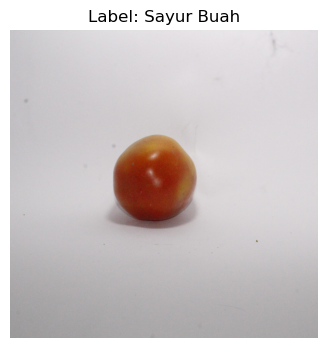

Shape	: (3456, 3456, 3)
Label	: Sayur Buah


In [29]:
img_viz(df, 40)

In [30]:
def crop_center(img, ratio=0.8):
    h, w = img.shape[:2]
    ch, cw = int(h * ratio), int(w * ratio)
    y1 = (h - ch) // 2
    x1 = (w - cw) // 2
    return img[y1:y1+ch, x1:x1+cw]

In [31]:
def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=1.2, tileGridSize=(8,8))
    cl = clahe.apply(l)

    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

In [32]:
def segment_object_otsu(img):
    gry = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    _, img_thresh = cv2.threshold(
        gry, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    kernel = np.ones((3,3), np.uint8)
    img_thresh_open = cv2.morphologyEx(img_thresh, cv2.MORPH_OPEN, kernel)

    img_thresh_inv = cv2.bitwise_not(img_thresh_open)
    img_thresh_final = cv2.erode(img_thresh_inv, kernel, iterations=1)

    mask3 = np.repeat((img_thresh_final // 255)[..., None], 3, axis=2).astype("uint8")

    masked_bgr = img * mask3
    
    masked_rgb = cv2.cvtColor(masked_bgr, cv2.COLOR_BGR2RGB)
    
    return masked_rgb


In [33]:
def preprocessing_basic(img_list):
    result = []
    for img, label in img_list:
        
        cropped = crop_center(img)
        resized = cv2.resize(cropped, (224, 224))
        clahe = apply_clahe(resized)
        seg_mask = segment_object_otsu(clahe)   

        final_img = clahe * (seg_mask > 0)

        result.append((final_img, label))
    
    return result


In [34]:
basic = preprocessing_basic(df)

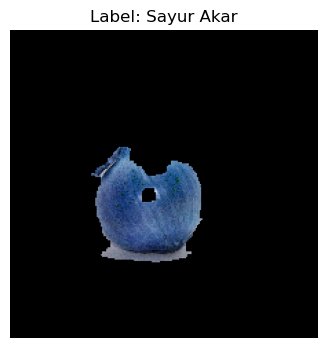

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [35]:
img_viz(basic, 0)

In [36]:
def augment_img_deterministic(img):
    out = []

    out.append(img.copy())

    out.append(cv2.flip(img, 1))

    out.append(cv2.flip(img, 0))

    out.append(cv2.convertScaleAbs(img, alpha=1.2, beta=10))

    out.append(cv2.convertScaleAbs(img, alpha=0.8, beta=-10))

    h, w = img.shape[:2]
    M1 = cv2.getRotationMatrix2D((w//2, h//2), 15, 1)
    out.append(cv2.warpAffine(img, M1, (w, h)))

    M2 = cv2.getRotationMatrix2D((w//2, h//2), -15, 1)
    out.append(cv2.warpAffine(img, M2, (w, h)))

    M3 = cv2.getAffineTransform(
        np.float32([[0, 0], [w, 0], [0, h]]),
        np.float32([[0, 0], [w*1.5, 0], [0, h*1.5]])
    )
    zoomed = cv2.warpAffine(img, M3, (w, h))
    out.append(zoomed)

    return out        

In [37]:
def apply_augmentation(processed_list):
    augmented = []
    for img, label in processed_list:
        augs = augment_img_deterministic(img)
        for aug_img in augs:
            augmented.append((aug_img, label))
    return augmented


In [38]:
aug = apply_augmentation(basic)

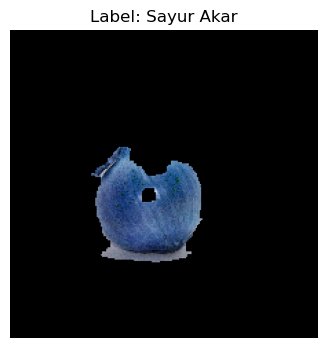

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [39]:
img_viz(aug, 0)

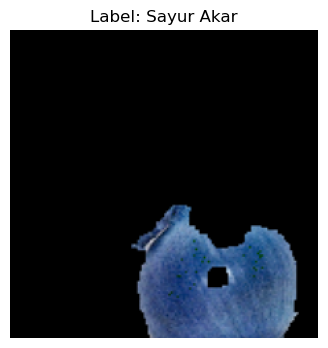

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [40]:
img_viz(aug, 7)

In [41]:
def preprocess_for_HOG(processed_list):
    result = []
    for img, label in processed_list:
        grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(grey, (3,3), 0)
        result.append((blurred, label))
    return result

In [42]:
hog_img = preprocess_for_HOG(aug)

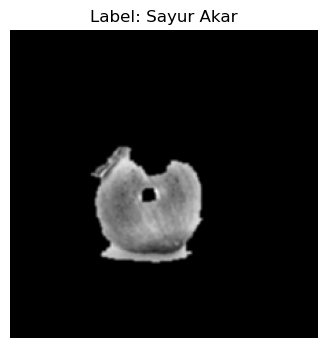

Shape	: (224, 224)
Label	: Sayur Akar


In [43]:
img_viz(hog_img, 0)

In [44]:
def preprocess_for_HSV(processed_list):
    result = []
    for img, label in processed_list:
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        result.append((hsv, label))
    return result

In [45]:
hsv_img = preprocess_for_HSV(aug)

In [46]:
hsv_img

[(array([[[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         ...,
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]],
  
         [[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],
          ...,
          [0, 0, 0],
          [0, 0, 0],
          [0, 0, 0]]], shape=(224, 224, 3), dtype=uint8),
  'Sayur Akar'),
 (array([[[0, 0, 0],
          [0, 0, 0],
          [0, 0, 0],


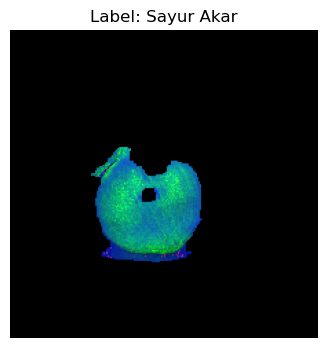

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [47]:
img_viz(hsv_img, 0)

In [48]:
def preprocess_for_GLCM(processed_list):
    result = []
    for img, label in processed_list:
        grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        result.append((grey, label))
    return result

In [49]:
glcm_img = preprocess_for_GLCM(aug)

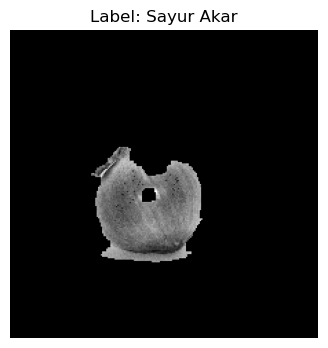

Shape	: (224, 224)
Label	: Sayur Akar


In [50]:
img_viz(glcm_img, 0)

In [51]:
from skimage.feature import graycomatrix, graycoprops
import numpy as np

def extract_GLCM(img_list):
    features = []

    distances = [1, 2]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

    for img, label in img_list:
        glcm = graycomatrix(img, distances=distances, angles=angles, symmetric=True, normed=True)

        contrast = graycoprops(glcm, 'contrast').flatten()
        homogeneity = graycoprops(glcm, 'homogeneity').flatten()
        energy = graycoprops(glcm, 'energy').flatten()
        correlation = graycoprops(glcm, 'correlation').flatten()

        glcm_feat = np.hstack([contrast, homogeneity, energy, correlation])
        features.append((glcm_feat, label))

    return features


In [52]:
glcm_feat = extract_GLCM(glcm_img)

In [53]:
glcm_feat[0]

(array([106.8642697 , 157.4388385 , 103.15246637, 148.39200467,
        193.8529601 , 157.4388385 , 186.08944659, 148.39200467,
          0.91016585,   0.90800518,   0.91037712,   0.90798588,
          0.90597563,   0.90800518,   0.90648381,   0.90798588,
          0.90156739,   0.8997586 ,   0.90150734,   0.89999988,
          0.89901252,   0.8997586 ,   0.89893207,   0.89999988,
          0.94660948,   0.92165821,   0.94846394,   0.92615993,
          0.90354024,   0.92165821,   0.9074033 ,   0.92615993]),
 'Sayur Akar')

In [54]:
import numpy as np

def extract_HSV_hist(img_list, bins=(8, 8, 8)):
    features = []
    for img, label in img_list:

        hist = cv2.calcHist(
            [img],
            [0, 1, 2],    # H, S, V channel
            None,
            bins,
            [0, 180, 0, 256, 0, 256]
        )

        hist = cv2.normalize(hist, hist).flatten()
        features.append((hist, label))

    return features


In [55]:
hsv_feat = extract_HSV_hist(hsv_img)

In [56]:
hsv_feat

[(array([9.9946648e-01, 0.0000000e+00, 2.2032151e-05, 1.5422505e-04,
         1.3880255e-03, 6.6096452e-04, 8.8128603e-05, 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00, 2.4235366e-04, 1.6524113e-03,
         4.5826873e-03, 3.3048226e-04, 0.0000000e+00, 4.4064302e-05,
         0.0000000e+00, 4.4064302e-05, 1.9828936e-04, 5.7283591e-04,
         2.0710223e-03, 2.9082438e-03, 3.5251441e-04, 2.2032151e-05,
         0.0000000e+00, 3.3048226e-04, 3.9657872e-04, 1.6744435e-03,
         9.8043075e-03, 9.3856966e-03, 3.0845011e-04, 0.0000000e+00,
         0.0000000e+00, 5.9486809e-04, 1.0575432e-03, 7.4468669e-03,
         2.3199854e-02, 4.4064303e-03, 0.0000000e+00, 0.0000000e+00,
         0.0000000e+00, 5.7283591e-04, 9.6941466e-04, 7.8434460e-03,
         1.1677040e-02, 3.0845011e-04, 0.0000000e+00, 0.0000000e+00,
         2.2032151e-05, 2.8641796e-04, 5.2877160e-04, 4.0539159e-03,
         2.7099545e-03, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         8.8128603e-05, 8.8128603e

In [57]:
from skimage.feature import hog

def extract_HOG(img_list):
    features = []
    for img, label in img_list:
        hog_feat = hog(
            img,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm='L2-Hys'
        )
        features.append((hog_feat, label))
    return features


In [58]:
hog_feat = extract_HOG(hog_img)

In [59]:
hog_feat

[(array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (arra

In [60]:
print(f"hog_feat shape: {len(hog_feat)} samples")
print(f"hog_feat[0][0] shape: {hog_feat[0][0].shape}")  # shape of feature vector

print(f"\nhsv_feat shape: {len(hsv_feat)} samples")
print(f"hsv_feat[0][0] shape: {hsv_feat[0][0].shape}")  # shape of feature vector

print(f"\nglcm_feat shape: {len(glcm_feat)} samples")
print(f"glcm_feat[0][0] shape: {glcm_feat[0][0].shape}")  # shape of feature vector


hog_feat shape: 1096 samples
hog_feat[0][0] shape: (26244,)

hsv_feat shape: 1096 samples
hsv_feat[0][0] shape: (512,)

glcm_feat shape: 1096 samples
glcm_feat[0][0] shape: (32,)


In [61]:
# Extract features and labels from each feature list
hog_features = np.array([feat[0] for feat in hog_feat])
hsv_features = np.array([feat[0] for feat in hsv_feat])
glcm_features = np.array([feat[0] for feat in glcm_feat])
labels = np.array([feat[1] for feat in hog_feat])

# Combine all features horizontally
combined_features = np.hstack([hog_features, hsv_features, glcm_features])

# Create dataframe
df_features = pd.DataFrame(combined_features)
df_features['label'] = labels

print(f"Combined dataframe shape: {df_features.shape}")
print(f"Total rows: {len(df_features)}")
print(f"Features columns: {combined_features.shape[1]}")
print(df_features.head())

Combined dataframe shape: (1096, 26789)
Total rows: 1096
Features columns: 26788
     0    1    2    3    4    5    6    7    8    9  ...     26779     26780  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.900000  0.946609   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.899759  0.946609   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.899759  0.946609   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.899999  0.946729   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.900001  0.934199   

      26781     26782     26783     26784     26785     26786     26787  \
0  0.921658  0.948464  0.926160  0.903540  0.921658  0.907403  0.926160   
1  0.926160  0.948464  0.921658  0.903540  0.926160  0.907403  0.921658   
2  0.926160  0.948464  0.921658  0.903540  0.926160  0.907403  0.921658   
3  0.921737  0.948524  0.926315  0.903728  0.921737  0.907477  0.926315   
4  0.905319  0.936961  0.911775  0.883537  0.905319  0.888762  

In [62]:
X = df_features.drop('label', axis=1).values
y = df_features['label'].values

In [63]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [64]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, 
    test_size=0.2, 
    random_state=42, 
    stratify=y_encoded
)

In [65]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [66]:
X_train_scaled

array([[-2.00400366e-01, -1.65604146e-01, -1.63658423e-01, ...,
         9.25427533e-02, -2.41904983e-01,  1.25593661e-01],
       [-2.00400366e-01, -1.65604146e-01, -1.63658423e-01, ...,
         4.16873222e-01,  4.28347353e-01,  3.59933354e-01],
       [-2.00400366e-01, -1.65604146e-01, -1.63658423e-01, ...,
        -1.63180880e+00, -6.30687167e-01, -2.31838383e-01],
       ...,
       [-2.00400366e-01, -1.65604146e-01, -1.63658423e-01, ...,
         7.03697924e-01,  4.08508573e-01,  9.00829035e-01],
       [-2.00400366e-01, -1.65604146e-01, -1.63658423e-01, ...,
        -1.55212010e+00,  2.45743936e-01, -2.13881161e+00],
       [-2.00400366e-01, -1.65604146e-01, -1.63658423e-01, ...,
         4.21829826e-04, -1.82427296e-01,  5.88657749e-02]],
      shape=(876, 26788))

## Metode SVM reduksi fitur MDS

In [80]:
from sklearn.decomposition import PCA
print("\n[1/3] Applying PCA...")
pca = PCA(n_components=0.95, random_state=42)  # Keep 95% variance
X_train_reduced = pca.fit_transform(X_train_scaled)
X_test_reduced = pca.transform(X_test_scaled)
print(f"PCA - Reduced to {pca.n_components_} components")
print(f"PCA - Explained variance: {pca.explained_variance_ratio_.sum():.4f}")


[1/3] Applying PCA...
PCA - Reduced to 375 components
PCA - Explained variance: 0.9502


In [82]:
X_train_reduced.shape

(876, 375)

In [68]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1],
    'kernel': ['rbf']
}


print("Parameter grid:")
for param, values in param_grid.items():
    print(f"  - {param}: {values}")

svm = SVC(random_state=42)
grid_search = GridSearchCV(
    svm, 
    param_grid, 
    cv=5, 
    scoring='accuracy', 
    n_jobs=-1, 
    verbose=2,
    return_train_score=True
)

grid_search.fit(X_train_reduced, y_train)

print("\n" + "="*70)
print("GRID SEARCH RESULTS")
print("="*70)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation score: {grid_search.best_score_:.4f}")
print(f"Total combinations tested: {len(grid_search.cv_results_['params'])}")

best_model = grid_search.best_estimator_

cv_results = pd.DataFrame(grid_search.cv_results_)
top_5 = cv_results.nlargest(5, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]
print("\nTop 5 parameter combinations:")
print(top_5.to_string(index=False))

Parameter grid:
  - C: [0.1, 1, 10, 100]
  - gamma: ['scale', 'auto', 0.001, 0.01, 0.1, 1]
  - kernel: ['rbf']
Fitting 5 folds for each of 24 candidates, totalling 120 fits


KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import classification_report
y_pred = best_model.predict(X_test_reduced)
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

  Sayur Akar       0.95      1.00      0.97        58
  Sayur Buah       1.00      0.94      0.97        53
 Sayur Bunga       0.94      1.00      0.97        48
  Sayur Daun       1.00      0.95      0.97        61

    accuracy                           0.97       220
   macro avg       0.97      0.97      0.97       220
weighted avg       0.97      0.97      0.97       220



In [ ]:
train_acc = best_model.score(X_train_reduced, y_train)
test_acc = best_model.score(X_test_reduced, y_test)
print("\n" + "="*70)
print("FINAL MODEL ACCURACY")
print("="*70)
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


FINAL MODEL ACCURACY
Training Accuracy: 1.0000
Test Accuracy: 0.9727


In [ ]:
import joblib

joblib.dump(best_model, 'svm_kategori_sayur_model_pca.joblib')

['svm_kategori_sayur_model_pca.joblib']

## Metode KNN tanpa reduksi fitur

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# =====================================
# KNN GRID SEARCH
# =====================================

knn_param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],  # Manhattan(1) & Euclidean(2)
    'metric': ['minkowski']
}

print("Parameter grid (KNN):")
for param, values in knn_param_grid.items():
    print(f"  - {param}: {values}")

knn = KNeighborsClassifier()

knn_grid_search = GridSearchCV(
    knn,
    knn_param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

knn_grid_search.fit(X_train_reduced, y_train)

print("\n" + "="*70)
print("KNN - GRID SEARCH RESULTS")
print("="*70)
print(f"Best parameters: {knn_grid_search.best_params_}")
print(f"Best cross-validation score: {knn_grid_search.best_score_:.4f}")
print(f"Total combinations tested: {len(knn_grid_search.cv_results_['params'])}")

knn_best_model = knn_grid_search.best_estimator_

knn_cv_results = pd.DataFrame(knn_grid_search.cv_results_)
knn_top_5 = knn_cv_results.nlargest(5, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]
print("\nTop 5 parameter combinations:")
print(knn_top_5.to_string(index=False))


Parameter grid (KNN):
  - n_neighbors: [3, 5, 7, 9, 11]
  - weights: ['uniform', 'distance']
  - p: [1, 2]
  - metric: ['minkowski']
Fitting 5 folds for each of 20 candidates, totalling 100 fits

KNN - GRID SEARCH RESULTS
Best parameters: {'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
Best cross-validation score: 0.8824
Total combinations tested: 20

Top 5 parameter combinations:
                                                                  params  mean_test_score  std_test_score  rank_test_score
{'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}         0.882429        0.012742                1
{'metric': 'minkowski', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}         0.860747        0.031550                2
{'metric': 'minkowski', 'n_neighbors': 5, 'p': 2, 'weights': 'distance'}         0.839052        0.010905                3
 {'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}         0.833344        0.

In [ ]:
from sklearn.metrics import classification_report
y_pred = knn_best_model.predict(X_test_reduced)
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

  Sayur Akar       1.00      1.00      1.00        58
  Sayur Buah       1.00      1.00      1.00        53
 Sayur Bunga       0.81      1.00      0.90        48
  Sayur Daun       1.00      0.82      0.90        61

    accuracy                           0.95       220
   macro avg       0.95      0.95      0.95       220
weighted avg       0.96      0.95      0.95       220



In [ ]:
train_acc = knn_best_model.score(X_train_reduced, y_train)
test_acc = knn_best_model.score(X_test_reduced, y_test)
print("\n" + "="*70)
print("FINAL MODEL ACCURACY")
print("="*70)
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


FINAL MODEL ACCURACY
Training Accuracy: 1.0000
Test Accuracy: 0.9500


In [ ]:
import joblib

joblib.dump(knn_best_model, 'knn_kategori_sayur_model_pca.joblib')

['knn_kategori_sayur_model_pca.joblib']

## Metode Random Forest tanpa reduksi fitur

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import pandas as pd

# =====================================
# RANDOM FOREST GRID SEARCH
# =====================================

rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

print("Parameter grid (Random Forest):")
for param, values in rf_param_grid.items():
    print(f"  - {param}: {values}")

rf = RandomForestClassifier(random_state=42)

rf_grid_search = GridSearchCV(
    rf,
    rf_param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

rf_grid_search.fit(X_train_reduced, y_train)

print("\n" + "="*70)
print("RANDOM FOREST - GRID SEARCH RESULTS")
print("="*70)
print(f"Best parameters: {rf_grid_search.best_params_}")
print(f"Best cross-validation score: {rf_grid_search.best_score_:.4f}")
print(f"Total combinations tested: {len(rf_grid_search.cv_results_['params'])}")

rf_best_model = rf_grid_search.best_estimator_

rf_cv_results = pd.DataFrame(rf_grid_search.cv_results_)
rf_top_5 = rf_cv_results.nlargest(5, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]
print("\nTop 5 parameter combinations:")
print(rf_top_5.to_string(index=False))


Parameter grid (Random Forest):
  - n_estimators: [100, 200, 300]
  - max_depth: [None, 10, 20, 30]
  - min_samples_split: [2, 5, 10]
  - min_samples_leaf: [1, 2, 4]
  - max_features: ['sqrt', 'log2']
Fitting 5 folds for each of 216 candidates, totalling 1080 fits

RANDOM FOREST - GRID SEARCH RESULTS
Best parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best cross-validation score: 0.9795
Total combinations tested: 216

Top 5 parameter combinations:
                                                                                                         params  mean_test_score  std_test_score  rank_test_score
{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}         0.979455        0.013324                1
  {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}         0.979455        0.013324   

In [ ]:
from sklearn.metrics import classification_report
y_pred = rf_best_model.predict(X_test_reduced)
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

  Sayur Akar       1.00      0.98      0.99        58
  Sayur Buah       1.00      0.96      0.98        53
 Sayur Bunga       0.96      1.00      0.98        48
  Sayur Daun       0.97      0.98      0.98        61

    accuracy                           0.98       220
   macro avg       0.98      0.98      0.98       220
weighted avg       0.98      0.98      0.98       220



In [ ]:
train_acc = rf_best_model.score(X_train_reduced, y_train)
test_acc = rf_best_model.score(X_test_reduced, y_test)
print("\n" + "="*70)
print("FINAL MODEL ACCURACY")
print("="*70)
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


FINAL MODEL ACCURACY
Training Accuracy: 1.0000
Test Accuracy: 0.9818


In [ ]:
import joblib

joblib.dump(rf_best_model, 'rf_kategori_sayur_model_pca.joblib')

['rf_kategori_sayur_model_pca.joblib']

## Testing dengan gambar lain

In [69]:
val_dir = 'validation/'

In [70]:
def load_dataset_without_subfolder(img_dir):
    p = Path(img_dir)
    img_list = []

    for file in p.glob("*"):
        if file.suffix.lower() in [".jpg", ".jpeg", ".png"]:
            
            img = mpimg.imread(file)
            if img is None:
                continue

            label = file.stem   # nama file tanpa ekstensi
            img_list.append((img, label))

    return img_list

In [71]:
val_image = load_dataset_without_subfolder(val_dir)

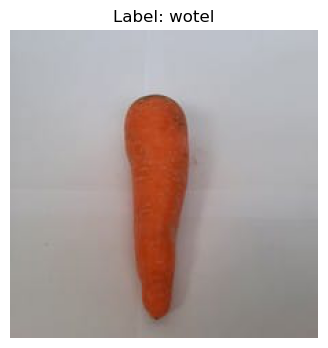

Shape	: (224, 224, 3)
Label	: wotel


In [72]:
img_viz(val_image, 10)

In [73]:
val_features = []
val_filenames = []

for img, filename in val_image:
    
    # preprocessing umum
    basic = preprocessing_basic([(img, "unknown")])
    
    # preprocessing khusus fitur
    hog_img  = preprocess_for_HOG(basic)
    hsv_img  = preprocess_for_HSV(basic)
    glcm_img = preprocess_for_GLCM(basic)

    # ekstraksi fitur
    hog_f  = extract_HOG(hog_img)[0][0]
    hsv_f  = extract_HSV_hist(hsv_img)[0][0]
    glcm_f = extract_GLCM(glcm_img)[0][0]

    combined = np.hstack([hog_f, hsv_f, glcm_f])

    val_features.append(combined)
    val_filenames.append(filename)


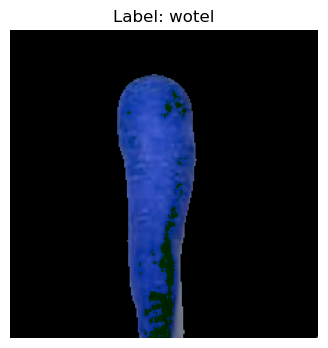

Shape	: (224, 224, 3)
Label	: wotel


In [74]:
basic_test = preprocessing_basic(val_image)
img_viz(basic_test, 10)

In [75]:
val_scaled = scaler.transform(val_features)

In [76]:
val_reduced = pca.transform(val_scaled)

In [77]:
val_reduced.shape

(11, 375)

In [79]:
import joblib

svm_model = joblib.load('svm_kategori_sayur_model_pca.joblib')
knn_model = joblib.load('knn_kategori_sayur_model_pca.joblib')
rf_model  = joblib.load('rf_kategori_sayur_model_pca.joblib')

svm_pred = svm_model.predict(val_reduced)
knn_pred = knn_model.predict(val_reduced)
rf_pred  = rf_model.predict(val_reduced)

ValueError: X has 375 features, but SVC is expecting 344 features as input.

In [ ]:
for f, s, k, r in zip(val_filenames, svm_pred, knn_pred, rf_pred):
    print(f"{f} => SVM: {s}, KNN: {k}, RF: {r}")

akar (1) => SVM: 2, KNN: 1, RF: 3
akar (2) => SVM: 3, KNN: 1, RF: 3
akar (3) => SVM: 2, KNN: 1, RF: 3
akar (4) => SVM: 2, KNN: 0, RF: 2
akar (5) => SVM: 2, KNN: 2, RF: 3
buah (1) => SVM: 3, KNN: 1, RF: 3
buah (2) => SVM: 2, KNN: 2, RF: 3
bunga (1) => SVM: 2, KNN: 0, RF: 2
bunga (2) => SVM: 3, KNN: 3, RF: 3
daun => SVM: 3, KNN: 0, RF: 2


In [ ]:
label_encoder = LabelEncoder()
label_encoder.fit(y)      # y = daftar label asli saat training

LabelEncoder()

In [ ]:
svm_labels = label_encoder.inverse_transform(svm_pred)
knn_labels = label_encoder.inverse_transform(knn_pred)
rf_labels  = label_encoder.inverse_transform(rf_pred)

In [ ]:
for f, s, k, r in zip(val_filenames, svm_labels, knn_labels, rf_labels):
    print(f"{f} => SVM: {s}, KNN: {k}, RF: {r}")


akar (1) => SVM: Sayur Bunga, KNN: Sayur Buah, RF: Sayur Daun
akar (2) => SVM: Sayur Daun, KNN: Sayur Buah, RF: Sayur Daun
akar (3) => SVM: Sayur Bunga, KNN: Sayur Buah, RF: Sayur Daun
akar (4) => SVM: Sayur Bunga, KNN: Sayur Akar, RF: Sayur Bunga
akar (5) => SVM: Sayur Bunga, KNN: Sayur Bunga, RF: Sayur Daun
buah (1) => SVM: Sayur Daun, KNN: Sayur Buah, RF: Sayur Daun
buah (2) => SVM: Sayur Bunga, KNN: Sayur Bunga, RF: Sayur Daun
bunga (1) => SVM: Sayur Bunga, KNN: Sayur Akar, RF: Sayur Bunga
bunga (2) => SVM: Sayur Daun, KNN: Sayur Daun, RF: Sayur Daun
daun => SVM: Sayur Daun, KNN: Sayur Akar, RF: Sayur Bunga


- menambah model yang lain
- memcoba reduksi dimensi

- menambah pca di hog dan dicoba
- menambah fitur statistical color harus jurnal
- data validasi yang berbeda
- ganti metode cropping (deteksi objek)
- morfologi